# Torus shape-space velocity: multiple-pair vs single-pair cocycle shape loss

This notebook mirrors the shape-space velocity analysis used for the subset-vs-additive
comparison, but it uses only the two **non-disentangled** age/disease-conditioned cocycle
models:

- `longitudinal_age_disease_conditioned_cocycle_shape_pair_loss_multiple_pairs`
- `longitudinal_age_disease_conditioned_cocycle_shape_pair_loss`

The flow has no explicit age/disease/residual branches. Accordingly, the maps below are:

1. healthy-conditioned total velocity (`diagnosis=0`);
2. diseased-conditioned total velocity (`diagnosis=1`);
3. diagnosis contrast (`diseased - healthy`).

The diagnosis contrast is a counterfactual conditioning effect, not a disentangled disease
latent subspace.


In [13]:
import json
import math
import random
import re
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import torch
import trimesh
from IPython.display import display
from plotly.subplots import make_subplots
from skimage.measure import marching_cubes

ROOT = Path("/home/jakaria/INR/Deep3DComp")
if not ROOT.exists():
    ROOT = Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

from deep_sdf import data as deep_sdf_data
from networks.deep_sdf_decoder import Decoder

SEED = 7
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

GPU_ID = 0
if torch.cuda.is_available():
    torch.cuda.set_device(GPU_ID)
DEVICE = torch.device(f"cuda:{GPU_ID}" if torch.cuda.is_available() else "cpu")

GRID_RES = 64
GRID_BATCH = 2**17
SURFACE_BATCH = 4096
DELTA_T = 0.10
FD_EPS = 1e-3
EVAL_TIME = 0.50
CONDITION_VALUES = {"healthy": 0.0, "diseased": 1.0}
MAP_NAMES = ("healthy", "diseased", "diagnosis_contrast")

# Held-out anchor fitting is the slowest section.
RUN_HELDOUT_ANALYSIS = True
TEST_ANCHOR_STEPS = 250
TEST_ANCHOR_SAMPLES = 4096

BASE = ROOT / "examples" / "Torus_subset_100_id_age_progression"
MULTIPLE_PAIR_DIR = (
    BASE / "longitudinal_age_disease_conditioned_cocycle_shape_pair_loss_multiple_pairs"
)
SINGLE_PAIR_DIR = BASE / "longitudinal_age_disease_conditioned_cocycle_shape_pair_loss"

MODEL_CONFIGS = {
    "multiple_pairs": {
        "label": "Cocycle shape loss - multiple pairs",
        "exp_dir": MULTIPLE_PAIR_DIR,
        "checkpoint": "latest",
    },
    "single_pair": {
        "label": "Cocycle shape loss - single pair",
        "exp_dir": SINGLE_PAIR_DIR,
        "checkpoint": "latest",
    },
}

print("Device:", DEVICE)
print("Grid resolution:", GRID_RES)
print("Evaluation time:", EVAL_TIME, "| finite step:", DELTA_T)


Device: cuda:0
Grid resolution: 64
Evaluation time: 0.5 | finite step: 0.1


## Load the non-disentangled conditioned flows

Both experiments use the same decoder and generic temporal-flow architecture. They differ
in the number of sampled cocycle and forward/backward shape-pair constraints.


In [14]:
class TemporalFlowMLP(torch.nn.Module):
    def __init__(self, latent_size, hidden_dims, age_condition_dim=0):
        super().__init__()
        self.age_condition_dim = max(0, int(age_condition_dim))
        dims = [latent_size + 2 + self.age_condition_dim] + list(hidden_dims) + [latent_size]
        layers = []
        for i in range(len(dims) - 1):
            layers.append(torch.nn.Linear(dims[i], dims[i + 1]))
            if i < len(dims) - 2:
                layers.append(torch.nn.ReLU(inplace=True))
        self.net = torch.nn.Sequential(*layers)

    def _prepare_condition(self, z, condition):
        if self.age_condition_dim <= 0:
            return None
        if condition is None:
            return torch.zeros(
                z.shape[0], self.age_condition_dim, device=z.device, dtype=z.dtype
            )
        condition = condition.to(device=z.device, dtype=z.dtype)
        if condition.ndim == 1:
            condition = condition.unsqueeze(1)
        if condition.shape[1] == self.age_condition_dim:
            return condition
        if condition.shape[1] == 1 and self.age_condition_dim > 1:
            return condition.repeat(1, self.age_condition_dim)
        raise ValueError(
            f"Condition width {condition.shape[1]} != {self.age_condition_dim}"
        )

    def forward(self, z, s, t, age_cond=None):
        if s.ndim == 1:
            s = s.unsqueeze(1)
        if t.ndim == 1:
            t = t.unsqueeze(1)
        parts = [z, s, t]
        if self.age_condition_dim > 0:
            parts.append(self._prepare_condition(z, age_cond))
        return self.net(torch.cat(parts, dim=1))


def apply_temporal_flow(flow, z, s, t, condition):
    return z + (t - s) * flow(z, s, t, age_cond=condition)


def checkpoint_path(exp_dir, subdir, checkpoint):
    name = str(checkpoint)
    if not name.endswith(".pth"):
        name += ".pth"
    path = Path(exp_dir) / subdir / name
    if not path.exists():
        raise FileNotFoundError(path)
    return path


def strip_module_prefix(state):
    return {key.removeprefix("module."): value for key, value in state.items()}


def latent_weights(payload):
    lat = payload.get("latent_codes_state_dict", payload.get("latent_codes"))
    if isinstance(lat, dict):
        lat = lat["weight"]
    if lat.ndim == 3 and lat.shape[1] == 1:
        lat = lat[:, 0]
    return lat.detach().float()


def load_model(config):
    exp_dir = Path(config["exp_dir"])
    specs = json.loads((exp_dir / "specs.json").read_text())
    decoder = Decoder(int(specs["CodeLength"]), **specs["NetworkSpecs"]).to(DEVICE)
    flow = TemporalFlowMLP(
        int(specs["CodeLength"]),
        list(specs.get("FlowHiddenDims", [256, 256])),
        age_condition_dim=(
            int(specs.get("AgeConditionDim", 0))
            if bool(specs.get("UseAgeConditioning", False))
            else 0
        ),
    ).to(DEVICE)

    model_payload = torch.load(
        checkpoint_path(exp_dir, "ModelParameters", config["checkpoint"]),
        map_location=DEVICE,
    )
    decoder.load_state_dict(strip_module_prefix(model_payload["model_state_dict"]))
    flow.load_state_dict(strip_module_prefix(model_payload["flow_state_dict"]))
    decoder.eval()
    flow.eval()

    latent_payload = torch.load(
        checkpoint_path(exp_dir, "LatentCodes", config["checkpoint"]),
        map_location="cpu",
    )
    weights = latent_weights(latent_payload)
    return {
        **config,
        "specs": specs,
        "decoder": decoder,
        "flow": flow,
        "latent_weights": weights,
        "mean_z": weights.mean(dim=0, keepdim=True).to(DEVICE),
        "epoch": int(model_payload.get("epoch", -1)),
    }


MODELS = {name: load_model(config) for name, config in MODEL_CONFIGS.items()}

checkpoint_rows = []
for key, model in MODELS.items():
    specs = model["specs"]
    checkpoint_rows.append(
        {
            "model_key": key,
            "model": model["label"],
            "checkpoint": model["checkpoint"],
            "loaded_epoch": model["epoch"],
            "mean_z_norm": float(model["mean_z"].norm().item()),
            "cocycle_pairs_per_subject": specs.get("CocyclePairsPerSubject"),
            "cocycle_backward_pairs_per_subject": specs.get(
                "CocycleBackwardPairsPerSubject"
            ),
            "pair_forward_pairs_per_subject": specs.get("PairForwardPairsPerSubject"),
            "pair_backward_pairs_per_subject": specs.get("PairBackwardPairsPerSubject"),
            "shape_cocycle_lambda": specs.get("CocycleShapeLossLambda"),
        }
    )
CHECKPOINT_TABLE = pd.DataFrame(checkpoint_rows)
display(CHECKPOINT_TABLE)


,model_key,model,checkpoint,loaded_epoch,mean_z_norm,cocycle_pairs_per_subject,cocycle_backward_pairs_per_subject,pair_forward_pairs_per_subject,pair_backward_pairs_per_subject,shape_cocycle_lambda
0,multiple_pairs,Cocycle shape loss - multiple pairs,latest,2000,0.020896,2,2,3,3,0.001
1,single_pair,Cocycle shape loss - single pair,latest,2000,0.019476,1,1,1,1,0.001


## Geometry and implicit-surface derivatives

For an SDF \(F(z,x)=0\), a latent velocity \(v_z\) induces signed outward normal speed

\[
v_n = -\frac{\partial F/\partial z \cdot v_z}{\|\nabla_x F\|}.
\]

The JVP result is checked against a centered finite difference in latent space. The finite
step INR maps use the model's exact transport rule rather than only `z + DELTA_T * v`.


In [15]:
def decode_points(decoder, z, xyz, batch_size=GRID_BATCH):
    z = z.reshape(1, -1)
    outputs = []
    with torch.no_grad():
        for start in range(0, xyz.shape[0], batch_size):
            x = xyz[start : start + batch_size].to(DEVICE)
            zz = z.expand(x.shape[0], -1)
            outputs.append(decoder(torch.cat([zz, x], dim=1)).squeeze(-1).cpu())
    return torch.cat(outputs).numpy()


def regular_grid(resolution=GRID_RES):
    axis = torch.linspace(-1.0, 1.0, int(resolution), dtype=torch.float32)
    grid = torch.stack(
        torch.meshgrid(axis, axis, axis, indexing="ij"), dim=-1
    ).reshape(-1, 3)
    return axis.numpy(), grid


def decode_grid(decoder, z, resolution=GRID_RES):
    axis, xyz = regular_grid(resolution)
    values = decode_points(decoder, z, xyz).reshape(
        resolution, resolution, resolution
    )
    return axis, values


def mesh_from_grid(sdf_grid):
    spacing = 2.0 / (sdf_grid.shape[0] - 1)
    vertices, faces, _, _ = marching_cubes(
        sdf_grid, level=0.0, spacing=(spacing, spacing, spacing)
    )
    mesh = trimesh.Trimesh(
        vertices=vertices - 1.0, faces=faces, process=False
    )
    if mesh.is_watertight and mesh.volume < 0.0:
        mesh.invert()
    return mesh


def surface_geometry(decoder, z, resolution=GRID_RES):
    axis, grid = decode_grid(decoder, z, resolution)
    mesh = mesh_from_grid(grid)
    vertices = torch.as_tensor(mesh.vertices, dtype=z.dtype, device=DEVICE)

    sdf_parts = []
    grad_parts = []
    for start in range(0, vertices.shape[0], SURFACE_BATCH):
        x = vertices[start : start + SURFACE_BATCH].detach().clone().requires_grad_(True)
        zz = z.detach().expand(x.shape[0], -1)
        sdf = decoder(torch.cat([zz, x], dim=1)).squeeze(-1)
        grad_x = torch.autograd.grad(sdf.sum(), x, create_graph=False)[0]
        sdf_parts.append(sdf.detach().cpu())
        grad_parts.append(grad_x.detach().cpu())

    sdf = torch.cat(sdf_parts).numpy()
    grad_x = torch.cat(grad_parts).numpy()
    grad_norm = np.linalg.norm(grad_x, axis=1) + 1e-12
    grad_unit = grad_x / grad_norm[:, None]
    alignment = np.einsum("ij,ij->i", grad_unit, np.asarray(mesh.vertex_normals))
    sdf_to_outward_sign = 1.0 if np.nanmedian(alignment) >= 0.0 else -1.0

    return {
        "axis": axis,
        "sdf_grid": grid,
        "mesh": mesh,
        "vertices": vertices,
        "base_sdf": sdf,
        "grad_norm": grad_norm,
        "outward_normals": sdf_to_outward_sign * grad_unit,
        "sdf_to_outward_sign": sdf_to_outward_sign,
        "median_normal_alignment": float(np.nanmedian(np.abs(alignment))),
    }


def latent_jvp_at_vertices(decoder, z, velocity, vertices):
    parts = []
    for start in range(0, vertices.shape[0], SURFACE_BATCH):
        x = vertices[start : start + SURFACE_BATCH].detach()
        z0 = z.detach().clone().requires_grad_(True)

        def decode_for_latent(latent):
            return decoder(
                torch.cat([latent.expand(x.shape[0], -1), x], dim=1)
            ).squeeze(-1)

        _, jvp = torch.autograd.functional.jvp(
            decode_for_latent,
            z0,
            velocity.detach(),
            create_graph=False,
            strict=False,
        )
        parts.append(jvp.detach().cpu())
    return torch.cat(parts).numpy()


def vertex_area_weights(mesh):
    weights = np.zeros(len(mesh.vertices), dtype=np.float64)
    contribution = np.asarray(mesh.area_faces, dtype=np.float64) / 3.0
    for corner in range(3):
        np.add.at(weights, np.asarray(mesh.faces)[:, corner], contribution)
    return weights


def conditioned_motion(model, z, time_value=EVAL_TIME, delta_t=DELTA_T):
    flow = model["flow"]
    s = torch.full((z.shape[0], 1), float(time_value), device=z.device, dtype=z.dtype)
    t_step = torch.full_like(s, float(time_value + delta_t))
    motions = {}
    transported = {}

    for name, value in CONDITION_VALUES.items():
        cond = torch.full_like(s, float(value))
        with torch.no_grad():
            velocity = flow(z, s, s, age_cond=cond)
            z_step = apply_temporal_flow(flow, z, s, t_step, cond)
        motions[name] = {"velocity": velocity, "z_step": z_step}
        transported[name] = z_step

    motions["diagnosis_contrast"] = {
        "velocity": motions["diseased"]["velocity"] - motions["healthy"]["velocity"],
        "z_step": z + transported["diseased"] - transported["healthy"],
    }
    return motions


def surface_motion_map(model, geometry, z, velocity, z_step, fd_eps=FD_EPS):
    vertices = geometry["vertices"]
    decoder = model["decoder"]
    jvp = latent_jvp_at_vertices(decoder, z, velocity, vertices)
    xyz_cpu = vertices.detach().cpu()
    sdf_step = decode_points(decoder, z_step, xyz_cpu)
    sdf_plus = decode_points(decoder, z + fd_eps * velocity, xyz_cpu)
    sdf_minus = decode_points(decoder, z - fd_eps * velocity, xyz_cpu)
    fd_directional = (sdf_plus - sdf_minus) / (2.0 * fd_eps)

    sign = geometry["sdf_to_outward_sign"]
    grad_norm = geometry["grad_norm"]
    normal_speed = -sign * jvp / grad_norm
    inr_difference = geometry["base_sdf"] - sdf_step
    weights = vertex_area_weights(geometry["mesh"])
    total_area = weights.sum()
    jvp_error = np.sqrt(np.average((jvp - fd_directional) ** 2, weights=weights))
    jvp_scale = np.sqrt(np.average(fd_directional**2, weights=weights)) + 1e-12

    return {
        "velocity": velocity.detach(),
        "z_step": z_step.detach(),
        "jvp": jvp,
        "normal_speed": normal_speed,
        "inr_difference": inr_difference,
        "arrows": normal_speed[:, None] * geometry["outward_normals"],
        "metrics": {
            "latent_velocity_norm": float(velocity.norm().item()),
            "mean_abs_normal_speed": float(
                np.average(np.abs(normal_speed), weights=weights)
            ),
            "rms_normal_speed": float(
                np.sqrt(np.average(normal_speed**2, weights=weights))
            ),
            "net_volume_rate": float(np.sum(normal_speed * weights)),
            "expanding_area_fraction": float(
                np.sum(weights[normal_speed > 0]) / total_area
            ),
            "contracting_area_fraction": float(
                np.sum(weights[normal_speed < 0]) / total_area
            ),
            "jvp_fd_relative_rmse": float(jvp_error / jvp_scale),
        },
    }


def weighted_correlation(a, b, weights):
    w = weights / weights.sum()
    ac = a - np.sum(w * a)
    bc = b - np.sum(w * b)
    denom = math.sqrt(np.sum(w * ac**2) * np.sum(w * bc**2)) + 1e-12
    return float(np.sum(w * ac * bc) / denom)


## Mean-shape conditioned velocity maps


In [16]:
GEOMETRY = {}
RESULTS = {}
metric_rows = []

for model_name, model in MODELS.items():
    print("Preparing:", model["label"])
    z = model["mean_z"]
    geometry = surface_geometry(model["decoder"], z)
    motions = conditioned_motion(model, z)
    GEOMETRY[model_name] = geometry
    RESULTS[model_name] = {}

    for map_name in MAP_NAMES:
        result = surface_motion_map(
            model,
            geometry,
            z,
            motions[map_name]["velocity"],
            motions[map_name]["z_step"],
        )
        RESULTS[model_name][map_name] = result
        metric_rows.append(
            {
                "model_key": model_name,
                "model": model["label"],
                "epoch": model["epoch"],
                "map": map_name,
                "median_abs_sdf_normal_alignment": geometry[
                    "median_normal_alignment"
                ],
                **result["metrics"],
            }
        )

METRICS = pd.DataFrame(metric_rows)
for model_name in MODELS:
    weights = vertex_area_weights(GEOMETRY[model_name]["mesh"])
    corr = weighted_correlation(
        RESULTS[model_name]["healthy"]["normal_speed"],
        RESULTS[model_name]["diseased"]["normal_speed"],
        weights,
    )
    METRICS.loc[
        METRICS["model_key"] == model_name, "healthy_diseased_shape_corr"
    ] = corr

display(METRICS)


Preparing: Cocycle shape loss - multiple pairs
Preparing: Cocycle shape loss - single pair


,model_key,model,epoch,map,median_abs_sdf_normal_alignment,latent_velocity_norm,mean_abs_normal_speed,rms_normal_speed,net_volume_rate,expanding_area_fraction,contracting_area_fraction,jvp_fd_relative_rmse,healthy_diseased_shape_corr
0,multiple_pairs,Cocycle shape loss - multiple pairs,2000,healthy,0.999618,0.446786,0.061005,0.061138,-0.246838,0.000000,1.000000,0.002652,0.212151
1,multiple_pairs,Cocycle shape loss - multiple pairs,2000,diseased,0.999618,0.905616,0.127153,0.129937,-0.514487,0.000000,1.000000,0.004491,0.212151
2,multiple_pairs,Cocycle shape loss - multiple pairs,2000,diagnosis_contrast,0.999618,0.597702,0.067241,0.071147,-0.267649,0.036995,0.963005,0.004983,0.212151
3,single_pair,Cocycle shape loss - single pair,2000,healthy,0.999601,0.448751,0.061469,0.061592,-0.248666,0.000000,1.000000,0.002687,0.309789
4,single_pair,Cocycle shape loss - single pair,2000,diseased,0.999601,0.891276,0.125561,0.128677,-0.507941,0.000337,0.999663,0.004480,0.309789
5,single_pair,Cocycle shape loss - single pair,2000,diagnosis_contrast,0.999601,0.584076,0.065651,0.069623,-0.259275,0.039946,0.960054,0.004628,0.309789


In [17]:
def robust_symmetric_limit(arrays, quantile=0.98):
    values = np.concatenate([np.ravel(np.asarray(a)) for a in arrays])
    values = values[np.isfinite(values)]
    limit = float(np.quantile(np.abs(values), quantile))
    return max(limit, 1e-12)


def mesh_surface_trace(
    mesh,
    values,
    cmin,
    cmax,
    colorscale="RdBu_r",
    show_colorbar=False,
    title="",
):
    vertices = np.asarray(mesh.vertices)
    faces = np.asarray(mesh.faces)
    return go.Mesh3d(
        x=vertices[:, 0],
        y=vertices[:, 1],
        z=vertices[:, 2],
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        intensity=np.asarray(values),
        intensitymode="vertex",
        colorscale=colorscale,
        cmin=cmin,
        cmax=cmax,
        showscale=show_colorbar,
        colorbar=dict(title=title, thickness=18, len=0.72),
        lighting=dict(ambient=0.45, diffuse=0.75, specular=0.25, roughness=0.65),
        lightposition=dict(x=100, y=150, z=200),
        flatshading=False,
        hovertemplate="value=%{intensity:.5g}<extra></extra>",
    )


def comparison_surface_figure(
    value_key, figure_title, colorbar_title, colorscale="RdBu_r", magnitude=False
):
    model_names = list(MODELS)
    arrays = [
        np.abs(RESULTS[name][map_name][value_key])
        if magnitude
        else RESULTS[name][map_name][value_key]
        for name in model_names
        for map_name in MAP_NAMES
    ]
    limit = robust_symmetric_limit(arrays)
    fig = make_subplots(
        rows=len(model_names),
        cols=len(MAP_NAMES),
        specs=[[{"type": "scene"}] * len(MAP_NAMES) for _ in model_names],
        row_titles=[MODELS[name]["label"] for name in model_names],
        column_titles=["Healthy condition", "Diseased condition", "Diagnosis contrast"],
        horizontal_spacing=0.01,
        vertical_spacing=0.025,
    )

    for row, name in enumerate(model_names, start=1):
        mesh = GEOMETRY[name]["mesh"]
        for col, map_name in enumerate(MAP_NAMES, start=1):
            values = RESULTS[name][map_name][value_key]
            if magnitude:
                values = np.abs(values)
            fig.add_trace(
                mesh_surface_trace(
                    mesh,
                    values,
                    0.0 if magnitude else -limit,
                    limit,
                    colorscale=colorscale,
                    show_colorbar=(row == 1 and col == len(MAP_NAMES)),
                    title=colorbar_title,
                ),
                row=row,
                col=col,
            )

    for scene_name in [key for key in fig.layout if str(key).startswith("scene")]:
        fig.layout[scene_name].update(
            aspectmode="data",
            xaxis_visible=False,
            yaxis_visible=False,
            zaxis_visible=False,
            camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
        )
    fig.update_layout(
        title=dict(
            text=f"{figure_title}<br><sup>pooled 98th-percentile limit: {limit:.4g}</sup>",
            x=0.5,
        ),
        height=350 * len(model_names),
        width=1120,
        margin=dict(l=150, r=30, t=100, b=20),
    )
    return fig


comparison_surface_figure(
    "normal_speed",
    "Instantaneous signed outward normal surface speed",
    "normal speed",
).show()

comparison_surface_figure(
    "normal_speed",
    "Normal-speed magnitude",
    "|normal speed|",
    colorscale="YlOrRd",
    magnitude=True,
).show()


## Finite-step INR difference

The healthy and diseased columns use the exact conditioned transport from `t` to
`t + DELTA_T`. The diagnosis-contrast column applies the difference between those two
transport displacements to the same starting latent.


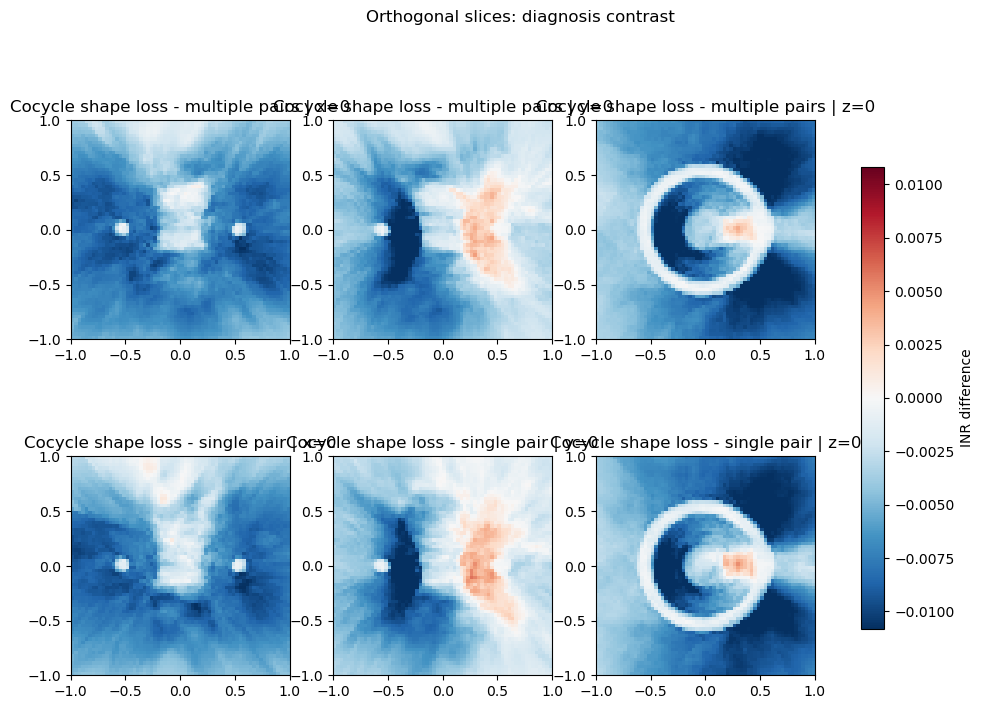

In [18]:
comparison_surface_figure(
    "inr_difference",
    f"INR(z) - INR(transported z), finite step {DELTA_T:g}",
    "SDF difference",
).show()


def inr_difference_grid(model_name, map_name, resolution=GRID_RES):
    model = MODELS[model_name]
    z = model["mean_z"]
    z_step = RESULTS[model_name][map_name]["z_step"]
    axis, base = decode_grid(model["decoder"], z, resolution)
    _, step = decode_grid(model["decoder"], z_step, resolution)
    return axis, base - step


def plot_difference_slices(map_name="diagnosis_contrast"):
    grids = []
    for model_name in MODELS:
        axis, difference = inr_difference_grid(model_name, map_name)
        grids.append((model_name, axis, difference))
    limit = robust_symmetric_limit([item[2] for item in grids])
    fig, axes = plt.subplots(len(grids), 3, figsize=(12, 4 * len(grids)), squeeze=False)

    for row, (model_name, axis, difference) in enumerate(grids):
        center = difference.shape[0] // 2
        slices = [
            difference[center, :, :],
            difference[:, center, :],
            difference[:, :, center],
        ]
        for col, (image, plane) in enumerate(zip(slices, ("x=0", "y=0", "z=0"))):
            im = axes[row, col].imshow(
                image.T,
                origin="lower",
                extent=(axis[0], axis[-1], axis[0], axis[-1]),
                cmap="RdBu_r",
                vmin=-limit,
                vmax=limit,
            )
            axes[row, col].set_title(f"{MODELS[model_name]['label']} | {plane}")
            axes[row, col].set_aspect("equal")

    fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.75, label="INR difference")
    fig.suptitle(f"Orthogonal slices: {map_name.replace('_', ' ')}")
    plt.show()


plot_difference_slices("diagnosis_contrast")


## Perturbed surfaces and local normal arrows


In [19]:
def perturbed_mesh(model_name, map_name):
    model = MODELS[model_name]
    _, grid = decode_grid(
        model["decoder"], RESULTS[model_name][map_name]["z_step"], GRID_RES
    )
    return mesh_from_grid(grid)


def overlay_arrow_figure(model_name, map_name, arrow_count=350):
    model = MODELS[model_name]
    base_mesh = GEOMETRY[model_name]["mesh"]
    step_mesh = perturbed_mesh(model_name, map_name)
    values = RESULTS[model_name][map_name]["normal_speed"]
    arrows = RESULTS[model_name][map_name]["arrows"]
    limit = robust_symmetric_limit([values])
    fig = go.Figure()
    fig.add_trace(
        mesh_surface_trace(
            base_mesh,
            values,
            -limit,
            limit,
            show_colorbar=True,
            title="normal speed",
        )
    )

    step_v = np.asarray(step_mesh.vertices)
    step_f = np.asarray(step_mesh.faces)
    fig.add_trace(
        go.Mesh3d(
            x=step_v[:, 0],
            y=step_v[:, 1],
            z=step_v[:, 2],
            i=step_f[:, 0],
            j=step_f[:, 1],
            k=step_f[:, 2],
            color="#00A6A6",
            opacity=0.20,
            name="transported surface",
            hoverinfo="skip",
        )
    )

    count = min(int(arrow_count), len(base_mesh.vertices))
    indices = np.linspace(0, len(base_mesh.vertices) - 1, count, dtype=int)
    xyz = np.asarray(base_mesh.vertices)[indices]
    vec = arrows[indices]
    fig.add_trace(
        go.Cone(
            x=xyz[:, 0],
            y=xyz[:, 1],
            z=xyz[:, 2],
            u=vec[:, 0],
            v=vec[:, 1],
            w=vec[:, 2],
            sizemode="scaled",
            sizeref=max(limit, 1e-8) * 4.0,
            colorscale="Greys",
            showscale=False,
            opacity=0.65,
            name="normal velocity",
            hoverinfo="skip",
        )
    )
    fig.update_layout(
        title=f"{model['label']} | {map_name.replace('_', ' ')} | epoch {model['epoch']}",
        scene=dict(
            aspectmode="data",
            xaxis_visible=False,
            yaxis_visible=False,
            zaxis_visible=False,
            camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
        ),
        width=850,
        height=700,
        margin=dict(l=0, r=0, t=65, b=0),
    )
    return fig


for model_name in MODELS:
    overlay_arrow_figure(model_name, "diagnosis_contrast").show()


## Shape-space summary and decoder gain


,model,epoch,map,latent_velocity_norm,mean_abs_normal_speed,rms_normal_speed,net_volume_rate,expanding_area_fraction,contracting_area_fraction,jvp_fd_relative_rmse,healthy_diseased_shape_corr
2,Cocycle shape loss - multiple pairs,2000,diagnosis_contrast,0.597702,0.067241,0.071147,-0.267649,0.036995,0.963005,0.004983,0.212151
1,Cocycle shape loss - multiple pairs,2000,diseased,0.905616,0.127153,0.129937,-0.514487,0.000000,1.000000,0.004491,0.212151
0,Cocycle shape loss - multiple pairs,2000,healthy,0.446786,0.061005,0.061138,-0.246838,0.000000,1.000000,0.002652,0.212151
5,Cocycle shape loss - single pair,2000,diagnosis_contrast,0.584076,0.065651,0.069623,-0.259275,0.039946,0.960054,0.004628,0.309789
4,Cocycle shape loss - single pair,2000,diseased,0.891276,0.125561,0.128677,-0.507941,0.000337,0.999663,0.004480,0.309789
3,Cocycle shape loss - single pair,2000,healthy,0.448751,0.061469,0.061592,-0.248666,0.000000,1.000000,0.002687,0.309789


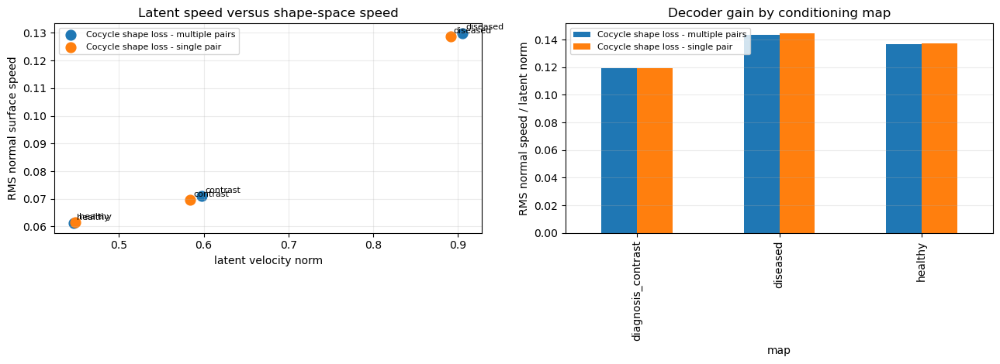

In [20]:
SUMMARY_COLUMNS = [
    "model",
    "epoch",
    "map",
    "latent_velocity_norm",
    "mean_abs_normal_speed",
    "rms_normal_speed",
    "net_volume_rate",
    "expanding_area_fraction",
    "contracting_area_fraction",
    "jvp_fd_relative_rmse",
    "healthy_diseased_shape_corr",
]
display(METRICS[SUMMARY_COLUMNS].sort_values(["model", "map"]))

GAIN_DF = METRICS.copy()
GAIN_DF["decoder_gain"] = (
    GAIN_DF["rms_normal_speed"]
    / GAIN_DF["latent_velocity_norm"].clip(lower=1e-12)
)

fig, axes = plt.subplots(1, 2, figsize=(13, 4.8))
for model_name, model in MODELS.items():
    sub = GAIN_DF[GAIN_DF["model_key"] == model_name]
    axes[0].scatter(
        sub["latent_velocity_norm"],
        sub["rms_normal_speed"],
        s=85,
        label=model["label"],
    )
    for _, row in sub.iterrows():
        axes[0].annotate(
            row["map"].replace("diagnosis_", ""),
            (row["latent_velocity_norm"], row["rms_normal_speed"]),
            fontsize=8,
            xytext=(3, 3),
            textcoords="offset points",
        )

GAIN_DF.pivot(index="map", columns="model", values="decoder_gain").plot.bar(
    ax=axes[1]
)
axes[0].set_title("Latent speed versus shape-space speed")
axes[0].set_xlabel("latent velocity norm")
axes[0].set_ylabel("RMS normal surface speed")
axes[0].grid(alpha=0.25)
axes[0].legend(fontsize=8)
axes[1].set_title("Decoder gain by conditioning map")
axes[1].set_ylabel("RMS normal speed / latent norm")
axes[1].grid(axis="y", alpha=0.25)
axes[1].legend(fontsize=8)
plt.tight_layout()
plt.show()


## Direct-vs-composed cocycle and backward-closure diagnostics

These measurements are especially relevant to this comparison. They evaluate whether a
direct transport \(s \rightarrow t\) agrees with the composed transport
\(s \rightarrow r \rightarrow t\), and whether transporting back from \(t\) returns to
the source latent. Both latent error and decoder-space SDF error are reported.


In [21]:
CONSISTENCY_TRIPLETS = [(0.10, 0.45, 0.80), (0.20, 0.55, 0.90)]
CONSISTENCY_POINT_COUNT = 8192
CONSISTENCY_XYZ = (
    torch.rand(CONSISTENCY_POINT_COUNT, 3, dtype=torch.float32) * 2.0 - 1.0
)


def transport(model, z, source_time, target_time, diagnosis):
    s = torch.full(
        (z.shape[0], 1), float(source_time), device=z.device, dtype=z.dtype
    )
    t = torch.full_like(s, float(target_time))
    cond = torch.full_like(s, float(diagnosis))
    with torch.no_grad():
        return apply_temporal_flow(model["flow"], z, s, t, cond)


def decoder_pair_rmse(decoder, z_a, z_b, xyz=CONSISTENCY_XYZ):
    values_a = decode_points(decoder, z_a, xyz)
    values_b = decode_points(decoder, z_b, xyz)
    return float(np.sqrt(np.mean((values_a - values_b) ** 2)))


consistency_rows = []
for model_name, model in MODELS.items():
    z0 = model["mean_z"]
    for diagnosis in (0, 1):
        for source_time, middle_time, target_time in CONSISTENCY_TRIPLETS:
            z_direct = transport(model, z0, source_time, target_time, diagnosis)
            z_middle = transport(model, z0, source_time, middle_time, diagnosis)
            z_composed = transport(
                model, z_middle, middle_time, target_time, diagnosis
            )
            z_back = transport(
                model, z_direct, target_time, source_time, diagnosis
            )
            consistency_rows.append(
                {
                    "model_key": model_name,
                    "model": model["label"],
                    "diagnosis": diagnosis,
                    "source_time": source_time,
                    "middle_time": middle_time,
                    "target_time": target_time,
                    "direct_composed_latent_rmse": float(
                        torch.sqrt(torch.mean((z_direct - z_composed) ** 2)).item()
                    ),
                    "backward_closure_latent_rmse": float(
                        torch.sqrt(torch.mean((z0 - z_back) ** 2)).item()
                    ),
                    "direct_composed_sdf_rmse": decoder_pair_rmse(
                        model["decoder"], z_direct, z_composed
                    ),
                    "backward_closure_sdf_rmse": decoder_pair_rmse(
                        model["decoder"], z0, z_back
                    ),
                }
            )

CONSISTENCY_DF = pd.DataFrame(consistency_rows)
display(CONSISTENCY_DF)
display(
    CONSISTENCY_DF.groupby(["model", "diagnosis"])[
        [
            "direct_composed_latent_rmse",
            "backward_closure_latent_rmse",
            "direct_composed_sdf_rmse",
            "backward_closure_sdf_rmse",
        ]
    ]
    .mean()
    .reset_index()
)


,model_key,model,diagnosis,source_time,middle_time,target_time,direct_composed_latent_rmse,backward_closure_latent_rmse,direct_composed_sdf_rmse,backward_closure_sdf_rmse
0,multiple_pairs,Cocycle shape loss - multiple pairs,0,0.1,0.45,0.8,0.000939,0.001613,0.000241,0.000611
1,multiple_pairs,Cocycle shape loss - multiple pairs,0,0.2,0.55,0.9,0.001283,0.001663,0.000302,0.001832
2,multiple_pairs,Cocycle shape loss - multiple pairs,1,0.1,0.45,0.8,0.001578,0.002209,0.000328,0.002640
3,multiple_pairs,Cocycle shape loss - multiple pairs,1,0.2,0.55,0.9,0.002325,0.003137,0.001546,0.003722
4,single_pair,Cocycle shape loss - single pair,0,0.1,0.45,0.8,0.001168,0.001497,0.000265,0.000560
5,single_pair,Cocycle shape loss - single pair,0,0.2,0.55,0.9,0.001195,0.001822,0.000447,0.000455
6,single_pair,Cocycle shape loss - single pair,1,0.1,0.45,0.8,0.001833,0.002168,0.000310,0.002475
7,single_pair,Cocycle shape loss - single pair,1,0.2,0.55,0.9,0.002442,0.002473,0.001274,0.003087


,model,diagnosis,direct_composed_latent_rmse,backward_closure_latent_rmse,direct_composed_sdf_rmse,backward_closure_sdf_rmse
0,Cocycle shape loss - multiple pairs,0,0.001111,0.001638,0.000271,0.001222
1,Cocycle shape loss - multiple pairs,1,0.001952,0.002673,0.000937,0.003181
2,Cocycle shape loss - single pair,0,0.001182,0.001660,0.000356,0.000508
3,Cocycle shape loss - single pair,1,0.002138,0.002320,0.000792,0.002781


## Held-out baseline anchors

One healthy and one diseased test subject are selected. Each model independently fits a
baseline latent from the first SDF scan, then the same anchor is evaluated under both
diagnosis conditions. This section is intentionally counterfactual and remains
non-disentangled.


In [22]:
TORUS_RE = re.compile(r"^(?:ID|id)_(\d+)_t(\d+)$")


def parse_scan(scan):
    match = TORUS_RE.match(Path(str(scan)).stem)
    if match is None:
        raise ValueError(scan)
    return int(match.group(1)), int(match.group(2))


def load_labels(labels_path):
    obj = torch.load(labels_path, map_location="cpu")
    rows = []
    for scan, payload in obj.items():
        row = {"scan_id": str(scan)}
        row.update(payload)
        rows.append(row)
    return pd.DataFrame(rows)


def test_records(specs):
    labels = load_labels(specs["AgeMetadataFile"])
    label_map = labels.set_index("scan_id").to_dict("index")
    split_path = Path(specs["TestSplit"])
    if not split_path.exists():
        split_path = (
            ROOT
            / "examples"
            / "splits"
            / "splits_torus_progression_age"
            / "test_split_torus.json"
        )
    split = json.loads(split_path.read_text())
    records = []
    for scan in split:
        stem = Path(str(scan)).stem
        sid, tp = parse_scan(stem)
        meta = label_map[stem]
        records.append(
            {
                "scan_id": stem,
                "sid": sid,
                "tp": tp,
                "time": float(meta["age_norm"]),
                "age": float(meta["age"]),
                "diagnosis": int(meta["diagnosis"]),
                "sdf_path": Path(specs["DataSource"]) / f"{stem}.npz",
            }
        )
    by_subject = {}
    for record in records:
        by_subject.setdefault(record["sid"], []).append(record)
    return {
        sid: sorted(subject_records, key=lambda item: item["time"])
        for sid, subject_records in by_subject.items()
    }


def choose_test_subjects(records_by_subject):
    healthy = next(
        sid
        for sid, records in records_by_subject.items()
        if int(records[0]["diagnosis"]) == 0
    )
    diseased = next(
        sid
        for sid, records in records_by_subject.items()
        if int(records[0]["diagnosis"]) == 1
    )
    return healthy, diseased


def infer_test_anchor(model, baseline_record):
    samples = deep_sdf_data.read_sdf_samples_into_ram(
        str(baseline_record["sdf_path"])
    )
    decoder = model["decoder"]
    decoder_params = list(decoder.parameters())
    requirements = [parameter.requires_grad for parameter in decoder_params]
    for parameter in decoder_params:
        parameter.requires_grad_(False)

    anchor = torch.empty(
        1, int(model["specs"]["CodeLength"]), device=DEVICE
    ).normal_(0.0, 0.01)
    anchor.requires_grad_(True)
    optimizer = torch.optim.Adam([anchor], lr=5e-3)
    clamp_dist = float(model["specs"].get("ClampingDistance", 0.1))
    code_reg = float(model["specs"].get("CodeRegularizationLambda", 1e-4))
    code_bound = model["specs"].get("CodeBound")
    history = []

    try:
        for _ in range(TEST_ANCHOR_STEPS):
            optimizer.zero_grad()
            batch = deep_sdf_data.unpack_sdf_samples_from_ram(
                samples, TEST_ANCHOR_SAMPLES
            ).to(DEVICE)
            xyz = batch[:, :3]
            sdf_gt = batch[:, 3:4].clamp(-clamp_dist, clamp_dist)
            pred = decoder(
                torch.cat([anchor.expand(xyz.shape[0], -1), xyz], dim=1)
            ).clamp(-clamp_dist, clamp_dist)
            loss = torch.nn.functional.l1_loss(pred, sdf_gt)
            loss = loss + code_reg * torch.mean(anchor**2)
            loss.backward()
            optimizer.step()
            if code_bound is not None and float(code_bound) > 0.0:
                with torch.no_grad():
                    norm = anchor.norm(dim=1, keepdim=True)
                    anchor.mul_(
                        torch.clamp(float(code_bound) / (norm + 1e-12), max=1.0)
                    )
            history.append(float(loss.detach().cpu().item()))
    finally:
        for parameter, required in zip(decoder_params, requirements):
            parameter.requires_grad_(required)
    return anchor.detach(), history


RECORDS = test_records(next(iter(MODELS.values()))["specs"])
HEALTHY_SID, DISEASED_SID = choose_test_subjects(RECORDS)
print("Selected healthy SID:", HEALTHY_SID, "| diseased SID:", DISEASED_SID)


Selected healthy SID: 27 | diseased SID: 4


In [23]:
HELDOUT = {}
if RUN_HELDOUT_ANALYSIS:
    for sid in (HEALTHY_SID, DISEASED_SID):
        baseline = RECORDS[sid][0]
        HELDOUT[sid] = {}
        for model_name, model in MODELS.items():
            print("Fitting", model["label"], "| SID", sid)
            anchor, history = infer_test_anchor(model, baseline)
            geometry = surface_geometry(model["decoder"], anchor)
            motions = conditioned_motion(
                model, anchor, time_value=baseline["time"]
            )
            maps = {
                map_name: surface_motion_map(
                    model,
                    geometry,
                    anchor,
                    motions[map_name]["velocity"],
                    motions[map_name]["z_step"],
                )
                for map_name in MAP_NAMES
            }
            HELDOUT[sid][model_name] = {
                "baseline": baseline,
                "anchor": anchor,
                "loss_history": history,
                "geometry": geometry,
                "maps": maps,
            }


def heldout_surface_figure(sid, value_key="normal_speed"):
    arrays = [
        HELDOUT[sid][model_name]["maps"][map_name][value_key]
        for model_name in MODELS
        for map_name in MAP_NAMES
    ]
    limit = robust_symmetric_limit(arrays)
    baseline = HELDOUT[sid][next(iter(MODELS))]["baseline"]
    fig = make_subplots(
        rows=len(MODELS),
        cols=len(MAP_NAMES),
        specs=[[{"type": "scene"}] * len(MAP_NAMES) for _ in MODELS],
        row_titles=[MODELS[name]["label"] for name in MODELS],
        column_titles=["Healthy", "Diseased", "Diagnosis contrast"],
    )
    for row, model_name in enumerate(MODELS, start=1):
        item = HELDOUT[sid][model_name]
        for col, map_name in enumerate(MAP_NAMES, start=1):
            fig.add_trace(
                mesh_surface_trace(
                    item["geometry"]["mesh"],
                    item["maps"][map_name][value_key],
                    -limit,
                    limit,
                    show_colorbar=(row == 1 and col == len(MAP_NAMES)),
                    title=value_key.replace("_", " "),
                ),
                row=row,
                col=col,
            )
    for scene_name in [key for key in fig.layout if str(key).startswith("scene")]:
        fig.layout[scene_name].update(
            aspectmode="data",
            xaxis_visible=False,
            yaxis_visible=False,
            zaxis_visible=False,
            camera=dict(eye=dict(x=1.55, y=1.55, z=1.05)),
        )
    status = "diseased" if baseline["diagnosis"] else "healthy"
    fig.update_layout(
        title=(
            f"Held-out SID {sid} ({status}), baseline age {baseline['age']:.2f}"
            f"<br><sup>{value_key}; pooled limit +/-{limit:.4g}</sup>"
        ),
        width=1120,
        height=350 * len(MODELS),
        margin=dict(l=150, r=30, t=90, b=20),
    )
    return fig


if RUN_HELDOUT_ANALYSIS:
    heldout_surface_figure(HEALTHY_SID).show()
    heldout_surface_figure(DISEASED_SID).show()
else:
    print("Held-out fitting skipped.")


Fitting Cocycle shape loss - multiple pairs | SID 27


Fitting Cocycle shape loss - single pair | SID 27
Fitting Cocycle shape loss - multiple pairs | SID 4
Fitting Cocycle shape loss - single pair | SID 4


## Held-out counterfactual trajectories


,sid,source_diagnosis,rollout_diagnosis,model_key,model,age,time,latent_displacement,surface_sdf_rms_change
0,27,0,0,multiple_pairs,Cocycle shape loss - multiple pairs,77.962471,0.699062,0.000000,0.000000
1,27,0,0,multiple_pairs,Cocycle shape loss - multiple pairs,78.649971,0.716249,0.011527,0.001155
2,27,0,0,multiple_pairs,Cocycle shape loss - multiple pairs,79.368477,0.734212,0.023879,0.002400
3,27,0,0,multiple_pairs,Cocycle shape loss - multiple pairs,81.046677,0.776167,0.053955,0.005441
4,27,0,0,multiple_pairs,Cocycle shape loss - multiple pairs,81.998978,0.799974,0.071768,0.007247
5,27,0,1,multiple_pairs,Cocycle shape loss - multiple pairs,77.962471,0.699062,0.000000,0.000000
6,27,0,1,multiple_pairs,Cocycle shape loss - multiple pairs,78.649971,0.716249,0.021729,0.002404
7,27,0,1,multiple_pairs,Cocycle shape loss - multiple pairs,79.368477,0.734212,0.045035,0.005034
8,27,0,1,multiple_pairs,Cocycle shape loss - multiple pairs,81.046677,0.776167,0.101605,0.011517
9,27,0,1,multiple_pairs,Cocycle shape loss - multiple pairs,81.998978,0.799974,0.134938,0.015490


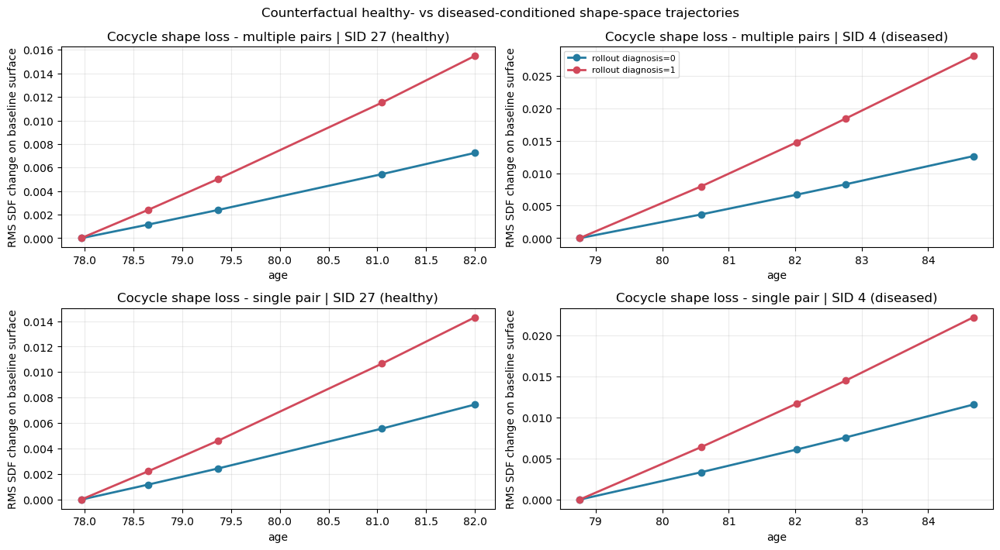

,sid,source_diagnosis,rollout_diagnosis,model_key,model,age,time,latent_displacement,surface_sdf_rms_change
24,4,1,0,multiple_pairs,Cocycle shape loss - multiple pairs,84.678932,0.866973,0.101176,0.012619
29,4,1,1,multiple_pairs,Cocycle shape loss - multiple pairs,84.678932,0.866973,0.217580,0.028042
4,27,0,0,multiple_pairs,Cocycle shape loss - multiple pairs,81.998978,0.799974,0.071768,0.007247
9,27,0,1,multiple_pairs,Cocycle shape loss - multiple pairs,81.998978,0.799974,0.134938,0.015490
34,4,1,0,single_pair,Cocycle shape loss - single pair,84.678932,0.866973,0.137733,0.011577
39,4,1,1,single_pair,Cocycle shape loss - single pair,84.678932,0.866973,0.182064,0.022208
14,27,0,0,single_pair,Cocycle shape loss - single pair,81.998978,0.799974,0.072196,0.007457
19,27,0,1,single_pair,Cocycle shape loss - single pair,81.998978,0.799974,0.125059,0.014299


In [24]:
def trajectory_rows(sid, model_name):
    item = HELDOUT[sid][model_name]
    model = MODELS[model_name]
    anchor = item["anchor"]
    baseline = item["baseline"]
    vertices = item["geometry"]["vertices"].detach().cpu()
    base_sdf = decode_points(model["decoder"], anchor, vertices)
    rows = []

    for diagnosis in (0, 1):
        for record in RECORDS[sid]:
            z_t = transport(
                model,
                anchor,
                baseline["time"],
                record["time"],
                diagnosis,
            )
            sdf_t = decode_points(model["decoder"], z_t, vertices)
            rows.append(
                {
                    "sid": sid,
                    "source_diagnosis": baseline["diagnosis"],
                    "rollout_diagnosis": diagnosis,
                    "model_key": model_name,
                    "model": model["label"],
                    "age": record["age"],
                    "time": record["time"],
                    "latent_displacement": float(torch.norm(z_t - anchor).item()),
                    "surface_sdf_rms_change": float(
                        np.sqrt(np.mean((base_sdf - sdf_t) ** 2))
                    ),
                }
            )
    return rows


if RUN_HELDOUT_ANALYSIS:
    TRAJECTORIES = pd.DataFrame(
        [
            row
            for sid in (HEALTHY_SID, DISEASED_SID)
            for model_name in MODELS
            for row in trajectory_rows(sid, model_name)
        ]
    )
    display(TRAJECTORIES)

    fig, axes = plt.subplots(
        len(MODELS), 2, figsize=(13, 3.6 * len(MODELS)), squeeze=False
    )
    colors = {0: "#247BA0", 1: "#D1495B"}
    for row, (model_name, model) in enumerate(MODELS.items()):
        for col, sid in enumerate((HEALTHY_SID, DISEASED_SID)):
            ax = axes[row, col]
            for diagnosis in (0, 1):
                subset = TRAJECTORIES[
                    (TRAJECTORIES["model_key"] == model_name)
                    & (TRAJECTORIES["sid"] == sid)
                    & (TRAJECTORIES["rollout_diagnosis"] == diagnosis)
                ].sort_values("age")
                ax.plot(
                    subset["age"],
                    subset["surface_sdf_rms_change"],
                    marker="o",
                    linewidth=2,
                    color=colors[diagnosis],
                    label=f"rollout diagnosis={diagnosis}",
                )
            source_status = (
                "diseased"
                if int(RECORDS[sid][0]["diagnosis"]) == 1
                else "healthy"
            )
            ax.set_title(f"{model['label']} | SID {sid} ({source_status})")
            ax.set_xlabel("age")
            ax.set_ylabel("RMS SDF change on baseline surface")
            ax.grid(alpha=0.25)
            if row == 0 and col == 1:
                ax.legend(fontsize=8)
    fig.suptitle(
        "Counterfactual healthy- vs diseased-conditioned shape-space trajectories"
    )
    fig.tight_layout()
    plt.show()

    endpoint_summary = (
        TRAJECTORIES.sort_values("age")
        .groupby(["model", "sid", "source_diagnosis", "rollout_diagnosis"])
        .tail(1)
        .sort_values(["model", "sid", "rollout_diagnosis"])
    )
    display(endpoint_summary)


## Interpretation checklist

- Compare `diagnosis_contrast` RMS normal speed to the healthy/diseased total speeds. A
  small contrast means diagnosis conditioning changes little at the evaluated state.
- Use `healthy_diseased_shape_corr` with the magnitude table. High correlation alone does
  not imply that the two velocities have the same strength.
- Verify `jvp_fd_relative_rmse` before trusting local normal-speed maps.
- Compare direct/composed and backward-closure errors between the multiple-pair and
  single-pair models. These are the diagnostics most directly linked to the training
  difference.
- Treat counterfactual diagnosis differences as conditional effects only. This notebook
  intentionally does not use or claim a disentangled experiment.


## Ground-truth forecast comparison

This section evaluates predictions against the actual held-out meshes. It uses:

- the same first-visit observation for every model;
- direct transport from the fitted baseline anchor to each visit;
- the configured `chamfer_torus_aligned` metric: centroid alignment followed by
  symmetric squared Chamfer distance;
- deterministic surface sampling;
- baseline reconstruction and future-visit forecasting reported separately.

The comparison includes the two non-disentangled models and current checkpoints from the
executed disentangled experiment families. The old executed disentanglement notebooks
recorded epoch 800 and epoch 1000, while their current `latest.pth` files are epoch 2000.
Those historical notebooks also used raw symmetric Chamfer rather than centroid-aligned
Chamfer. Their numbers are shown separately and are not mixed into the current checkpoint
ranking.


In [25]:
from deep_sdf.metrics.chamfer import compute_chamfer
from networks.longitudinal_disentangled_flow import (
    build_temporal_flow as build_counterfactual_disentangled_flow,
)
from networks.longitudinal_disentangled_flow_64_128_64_adv import (
    build_temporal_flow as build_subset64_flow,
)

# Full evaluation controls. Set GT_EVAL_MAX_SUBJECTS to a small integer for a quick run.
GT_EVAL_MAX_SUBJECTS = None
GT_EVAL_GRID_RES = 64
GT_EVAL_ANCHOR_STEPS = 250
GT_EVAL_ANCHOR_SAMPLES = 4096
GT_EVAL_CHAMFER_SAMPLES = 10000
GT_EVAL_COMPOSED = False
GT_EVAL_COMPOSED_MAX_DT = 0.05
GT_EVAL_SEED = 1729

SUBSET64_DIR = (
    BASE
    / "longitudinal_age_disease_conditioned_cocycle_shape_pair_loss_multiple_pairs_disentangled_velocity_64_128_64_binary_margin_adv"
)
COUNTERFACTUAL_DISENTANGLED_DIR = (
    BASE
    / "longitudinal_age_disease_conditioned_cocycle_shape_pair_loss_multiple_pairs_disentangled_velocity_counterfactual"
)

DISENTANGLED_EVAL_CONFIGS = {
    "subset64_best": {
        "label": "Disentangled 64/128/64 - best",
        "exp_dir": SUBSET64_DIR,
        "checkpoint": "500",
        "builder": build_subset64_flow,
        "family": "disentangled_64_128_64",
    },
    "subset64_latest": {
        "label": "Disentangled 64/128/64 - latest",
        "exp_dir": SUBSET64_DIR,
        "checkpoint": "latest",
        "builder": build_subset64_flow,
        "family": "disentangled_64_128_64",
    },
    "counterfactual_disentangled_latest": {
        "label": "Disentangled counterfactual - latest",
        "exp_dir": COUNTERFACTUAL_DISENTANGLED_DIR,
        "checkpoint": "latest",
        "builder": build_counterfactual_disentangled_flow,
        "family": "disentangled_counterfactual",
    },
}


def load_disentangled_eval_model(config):
    exp_dir = Path(config["exp_dir"])
    specs = json.loads((exp_dir / "specs.json").read_text())
    decoder = Decoder(int(specs["CodeLength"]), **specs["NetworkSpecs"]).to(DEVICE)
    flow = config["builder"](
        specs,
        int(specs["CodeLength"]),
        list(specs.get("FlowHiddenDims", [256, 256])),
        age_condition_dim=int(specs.get("AgeConditionDim", 0)),
    ).to(DEVICE)
    payload = torch.load(
        checkpoint_path(exp_dir, "ModelParameters", config["checkpoint"]),
        map_location=DEVICE,
    )
    decoder.load_state_dict(strip_module_prefix(payload["model_state_dict"]))
    flow.load_state_dict(strip_module_prefix(payload["flow_state_dict"]))
    decoder.eval()
    flow.eval()
    return {
        **config,
        "specs": specs,
        "decoder": decoder,
        "flow": flow,
        "epoch": int(payload.get("epoch", -1)),
    }


GT_MODELS = dict(MODELS)
GT_MODELS.update(
    {
        key: load_disentangled_eval_model(config)
        for key, config in DISENTANGLED_EVAL_CONFIGS.items()
    }
)

GT_MODEL_TABLE = pd.DataFrame(
    [
        {
            "model_key": key,
            "model": model["label"],
            "family": model.get("family", "conditioned_cocycle"),
            "checkpoint": model["checkpoint"],
            "loaded_epoch": model["epoch"],
            "flow_type": model["specs"].get("FlowModelType", "standard"),
        }
        for key, model in GT_MODELS.items()
    ]
)
display(GT_MODEL_TABLE)

# Values already printed by the two older executed disentanglement notebooks.
HISTORICAL_EXECUTED_GT = pd.DataFrame(
    [
        {
            "notebook_model": "64/128/64 binary-margin",
            "executed_epoch": 800,
            "metric": "raw symmetric squared Chamfer",
            "sid": 27,
            "diagnosis": 0,
            "future_mean_chamfer": 0.00177625,
            "final_chamfer": 0.001808,
        },
        {
            "notebook_model": "64/128/64 binary-margin",
            "executed_epoch": 800,
            "metric": "raw symmetric squared Chamfer",
            "sid": 4,
            "diagnosis": 1,
            "future_mean_chamfer": 0.000535,
            "final_chamfer": 0.000458,
        },
        {
            "notebook_model": "counterfactual disentangled",
            "executed_epoch": 1000,
            "metric": "raw symmetric squared Chamfer",
            "sid": 27,
            "diagnosis": 0,
            "future_mean_chamfer": 0.00181925,
            "final_chamfer": 0.001802,
        },
        {
            "notebook_model": "counterfactual disentangled",
            "executed_epoch": 1000,
            "metric": "raw symmetric squared Chamfer",
            "sid": 4,
            "diagnosis": 1,
            "future_mean_chamfer": 0.00227325,
            "final_chamfer": 0.002780,
        },
    ]
)
display(HISTORICAL_EXECUTED_GT)


,model_key,model,family,checkpoint,loaded_epoch,flow_type
0,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,latest,2000,standard
1,single_pair,Cocycle shape loss - single pair,conditioned_cocycle,latest,2000,standard
2,subset64_best,Disentangled 64/128/64 - best,disentangled_64_128_64,500,500,disentangled_velocity
3,subset64_latest,Disentangled 64/128/64 - latest,disentangled_64_128_64,latest,2000,disentangled_velocity
4,counterfactual_disentangled_latest,Disentangled counterfactual - latest,disentangled_counterfactual,latest,2000,disentangled_velocity


,notebook_model,executed_epoch,metric,sid,diagnosis,future_mean_chamfer,final_chamfer
0,64/128/64 binary-margin,800,raw symmetric squared Chamfer,27,0,0.001776,0.001808
1,64/128/64 binary-margin,800,raw symmetric squared Chamfer,4,1,0.000535,0.000458
2,counterfactual disentangled,1000,raw symmetric squared Chamfer,27,0,0.001819,0.001802
3,counterfactual disentangled,1000,raw symmetric squared Chamfer,4,1,0.002273,0.002780


### Deterministic GT metric and forecast helpers

The anchor initialization is identical across models for a given subject. This removes a
source of avoidable model-to-model noise. Chamfer sampling is also deterministic for every
subject/visit.


In [26]:
def as_trimesh(mesh_like):
    if isinstance(mesh_like, trimesh.Scene):
        geometries = tuple(mesh_like.geometry.values())
        if not geometries:
            raise RuntimeError("Empty mesh scene")
        return trimesh.util.concatenate(geometries)
    return mesh_like


def deterministic_centroid_aligned_chamfer(
    predicted_mesh,
    gt_mesh,
    sample_count=GT_EVAL_CHAMFER_SAMPLES,
    seed=GT_EVAL_SEED,
):
    predicted_mesh = as_trimesh(predicted_mesh)
    gt_mesh = as_trimesh(gt_mesh)
    predicted_points = trimesh.sample.sample_surface(
        predicted_mesh, int(sample_count), seed=int(seed)
    )[0].astype(np.float32)
    gt_points = trimesh.sample.sample_surface(
        gt_mesh, int(sample_count), seed=int(seed) + 1
    )[0].astype(np.float32)
    predicted_points += gt_points.mean(axis=0) - predicted_points.mean(axis=0)
    chamfer, _ = compute_chamfer(predicted_points, gt_points)
    return float(chamfer)


def fit_gt_anchor(model, baseline_record, subject_seed):
    samples = deep_sdf_data.read_sdf_samples_into_ram(
        str(baseline_record["sdf_path"])
    )
    decoder = model["decoder"]
    parameters = list(decoder.parameters())
    requirements = [parameter.requires_grad for parameter in parameters]
    for parameter in parameters:
        parameter.requires_grad_(False)

    torch.manual_seed(int(subject_seed))
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(int(subject_seed))
    generator = torch.Generator(device=DEVICE)
    generator.manual_seed(int(subject_seed))
    anchor = torch.empty(
        1,
        int(model["specs"]["CodeLength"]),
        device=DEVICE,
        dtype=torch.float32,
    )
    anchor.normal_(0.0, 0.01, generator=generator)
    anchor.requires_grad_(True)
    optimizer = torch.optim.Adam([anchor], lr=5e-3)
    clamp_dist = float(model["specs"].get("ClampingDistance", 0.1))
    code_reg = float(model["specs"].get("CodeRegularizationLambda", 1e-4))
    code_bound = model["specs"].get("CodeBound")
    history = []

    try:
        for _ in range(int(GT_EVAL_ANCHOR_STEPS)):
            optimizer.zero_grad()
            batch = deep_sdf_data.unpack_sdf_samples_from_ram(
                samples, int(GT_EVAL_ANCHOR_SAMPLES)
            ).to(DEVICE)
            xyz = batch[:, :3]
            sdf_gt = batch[:, 3:4].clamp(-clamp_dist, clamp_dist)
            prediction = decoder(
                torch.cat([anchor.expand(xyz.shape[0], -1), xyz], dim=1)
            ).clamp(-clamp_dist, clamp_dist)
            loss = torch.nn.functional.l1_loss(prediction, sdf_gt)
            loss = loss + code_reg * torch.mean(anchor**2)
            loss.backward()
            optimizer.step()
            if code_bound is not None and float(code_bound) > 0.0:
                with torch.no_grad():
                    norm = anchor.norm(dim=1, keepdim=True)
                    anchor.mul_(
                        torch.clamp(float(code_bound) / (norm + 1e-12), max=1.0)
                    )
            history.append(float(loss.detach().cpu().item()))
    finally:
        for parameter, required in zip(parameters, requirements):
            parameter.requires_grad_(required)
    return anchor.detach(), history


def transport_composed(model, z, source_time, target_time, diagnosis, max_dt):
    total_dt = float(target_time) - float(source_time)
    if abs(total_dt) <= 1e-12:
        return z
    steps = max(1, int(math.ceil(abs(total_dt) / float(max_dt))))
    times = np.linspace(float(source_time), float(target_time), steps + 1)
    current = z
    for start, end in zip(times[:-1], times[1:]):
        current = transport(model, current, start, end, diagnosis)
    return current


def predict_gt_latent(model, anchor, baseline_time, target_time, diagnosis, rollout):
    if rollout == "direct":
        return transport(model, anchor, baseline_time, target_time, diagnosis)
    if rollout == "composed":
        return transport_composed(
            model,
            anchor,
            baseline_time,
            target_time,
            diagnosis,
            GT_EVAL_COMPOSED_MAX_DT,
        )
    raise ValueError(rollout)


def gt_mesh_for_record(model, record):
    path = Path(model["specs"]["DataSourceMesh"]) / f"{record['scan_id']}.obj"
    if not path.exists():
        raise FileNotFoundError(path)
    return as_trimesh(trimesh.load(path, force="mesh", process=False))


def predicted_mesh_for_latent(model, latent):
    _, grid = decode_grid(
        model["decoder"], latent, resolution=int(GT_EVAL_GRID_RES)
    )
    return mesh_from_grid(grid)


### Run matched test evaluation

This cell is computationally expensive because each model fits one baseline anchor per
test subject and decodes every visit. With the default settings it evaluates all 15 test
subjects. Reduce `GT_EVAL_MAX_SUBJECTS`, `GT_EVAL_GRID_RES`, or
`GT_EVAL_ANCHOR_STEPS` for a smoke test.


In [27]:
GT_SUBJECT_IDS = sorted(RECORDS)
if GT_EVAL_MAX_SUBJECTS is not None:
    GT_SUBJECT_IDS = GT_SUBJECT_IDS[: int(GT_EVAL_MAX_SUBJECTS)]

GT_ROLLOUTS = ["direct"]
if GT_EVAL_COMPOSED:
    GT_ROLLOUTS.append("composed")

GT_ANCHORS = {}
gt_rows = []

for model_index, (model_name, model) in enumerate(GT_MODELS.items()):
    print(f"\nModel: {model['label']} | epoch {model['epoch']}")
    GT_ANCHORS[model_name] = {}
    for subject_index, sid in enumerate(GT_SUBJECT_IDS, start=1):
        subject_records = RECORDS[sid]
        baseline = subject_records[0]
        print(
            f"  subject {subject_index:02d}/{len(GT_SUBJECT_IDS):02d}: "
            f"SID {sid}, diagnosis={baseline['diagnosis']}"
        )
        subject_seed = GT_EVAL_SEED + int(sid)

        anchor, history = fit_gt_anchor(model, baseline, subject_seed)

        GT_ANCHORS[model_name][sid] = {
            "anchor": anchor,
            "loss_history": history,
            "baseline": baseline,
        }
        baseline_time = float(baseline["time"])

        for rollout in GT_ROLLOUTS:
            for record in subject_records:
                latent = predict_gt_latent(
                    model,
                    anchor,
                    baseline_time,
                    float(record["time"]),
                    int(record["diagnosis"]),
                    rollout,
                )
                predicted_mesh = predicted_mesh_for_latent(model, latent)
                gt_mesh = gt_mesh_for_record(model, record)
                metric_seed = (
                    GT_EVAL_SEED
                    + 1000 * int(sid)
                    + int(record["tp"])
                )
                chamfer = deterministic_centroid_aligned_chamfer(
                    predicted_mesh,
                    gt_mesh,
                    sample_count=GT_EVAL_CHAMFER_SAMPLES,
                    seed=metric_seed,
                )
                gt_volume = abs(float(gt_mesh.volume))
                predicted_volume = abs(float(predicted_mesh.volume))
                gt_rows.append(
                    {
                        "model_key": model_name,
                        "model": model["label"],
                        "family": model.get("family", "conditioned_cocycle"),
                        "epoch": model["epoch"],
                        "rollout": rollout,
                        "sid": sid,
                        "diagnosis": int(record["diagnosis"]),
                        "scan_id": record["scan_id"],
                        "tp": int(record["tp"]),
                        "is_forecast": int(record["tp"]) > 0,
                        "age": float(record["age"]),
                        "time": float(record["time"]),
                        "aligned_chamfer": chamfer,
                        "gt_volume": gt_volume,
                        "predicted_volume": predicted_volume,
                        "absolute_volume_error": abs(predicted_volume - gt_volume),
                        "relative_volume_error": abs(predicted_volume - gt_volume)
                        / max(gt_volume, 1e-12),
                        "anchor_final_loss": (
                            float(history[-1]) if len(history) else np.nan
                        ),
                    }
                )

GT_FORECAST_DF = pd.DataFrame(gt_rows)
print(
    "Rows:", len(GT_FORECAST_DF),
    "| subjects:", GT_FORECAST_DF["sid"].nunique(),
    "| models:", GT_FORECAST_DF["model_key"].nunique(),
)
display(GT_FORECAST_DF.head(15))



Model: Cocycle shape loss - multiple pairs | epoch 2000
  subject 01/15: SID 4, diagnosis=1
  subject 02/15: SID 11, diagnosis=1
  subject 03/15: SID 13, diagnosis=1
  subject 04/15: SID 17, diagnosis=1
  subject 05/15: SID 27, diagnosis=0
  subject 06/15: SID 28, diagnosis=1
  subject 07/15: SID 29, diagnosis=0
  subject 08/15: SID 31, diagnosis=0
  subject 09/15: SID 54, diagnosis=0
  subject 10/15: SID 64, diagnosis=1
  subject 11/15: SID 69, diagnosis=0
  subject 12/15: SID 75, diagnosis=1
  subject 13/15: SID 86, diagnosis=1
  subject 14/15: SID 88, diagnosis=0
  subject 15/15: SID 97, diagnosis=1

Model: Cocycle shape loss - single pair | epoch 2000
  subject 01/15: SID 4, diagnosis=1
  subject 02/15: SID 11, diagnosis=1
  subject 03/15: SID 13, diagnosis=1
  subject 04/15: SID 17, diagnosis=1
  subject 05/15: SID 27, diagnosis=0
  subject 06/15: SID 28, diagnosis=1
  subject 07/15: SID 29, diagnosis=0
  subject 08/15: SID 31, diagnosis=0
  subject 09/15: SID 54, diagnosis=0
  s

,model_key,model,family,epoch,rollout,sid,diagnosis,scan_id,tp,is_forecast,age,time,aligned_chamfer,gt_volume,predicted_volume,absolute_volume_error,relative_volume_error,anchor_final_loss
0,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,4,1,ID_004_t0,0,False,78.753929,0.718848,0.001044,0.172340,0.211210,0.038869,0.225538,0.011162
1,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,4,1,ID_004_t1,1,True,80.586525,0.764663,0.000976,0.149861,0.175831,0.025970,0.173294,0.011162
2,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,4,1,ID_004_t2,2,True,82.017929,0.800448,0.000994,0.132067,0.148372,0.016305,0.123460,0.011162
3,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,4,1,ID_004_t3,3,True,82.758339,0.818958,0.000985,0.122344,0.134293,0.011949,0.097669,0.011162
4,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,4,1,ID_004_t4,4,True,84.678932,0.866973,0.001792,0.098284,0.098919,0.000635,0.006460,0.011162
5,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,11,1,ID_011_t0,0,False,79.388779,0.734719,0.001006,0.181991,0.225079,0.043088,0.236761,0.010540
6,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,11,1,ID_011_t1,1,True,80.302002,0.757550,0.000984,0.169994,0.206272,0.036278,0.213406,0.010540
7,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,11,1,ID_011_t2,2,True,81.744461,0.793612,0.000881,0.150941,0.176592,0.025651,0.169939,0.010540
8,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,11,1,ID_011_t3,3,True,83.353355,0.833834,0.000808,0.129281,0.144379,0.015098,0.116787,0.010540
9,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,11,1,ID_011_t4,4,True,83.972801,0.849320,0.000984,0.120676,0.132269,0.011593,0.096068,0.010540


### GT ranking, paired differences, and uncertainty

Ranking is based on future visits only (`t1` through `t4`). Confidence intervals are
subject-level bootstrap intervals, so repeated visits from one subject are not treated as
independent samples.


In [28]:
def bootstrap_subject_mean_ci(
    subject_values,
    value_column,
    samples=2000,
    seed=GT_EVAL_SEED,
):
    table = subject_values[["sid", value_column]].dropna()
    values = table[value_column].to_numpy(dtype=float)
    if len(values) == 0:
        return np.nan, np.nan, np.nan
    rng = np.random.default_rng(int(seed))
    draws = rng.choice(values, size=(int(samples), len(values)), replace=True)
    means = draws.mean(axis=1)
    return (
        float(values.mean()),
        float(np.quantile(means, 0.025)),
        float(np.quantile(means, 0.975)),
    )


future_df = GT_FORECAST_DF[GT_FORECAST_DF["is_forecast"]].copy()
subject_summary = (
    future_df.groupby(
        ["model_key", "model", "family", "epoch", "rollout", "sid", "diagnosis"]
    )
    .agg(
        subject_mean_chamfer=("aligned_chamfer", "mean"),
        subject_final_chamfer=("aligned_chamfer", "last"),
        subject_mean_relative_volume_error=("relative_volume_error", "mean"),
    )
    .reset_index()
)

ranking_rows = []
for keys, group in subject_summary.groupby(
    ["model_key", "model", "family", "epoch", "rollout"]
):
    model_key, model_label, family, epoch, rollout = keys
    mean_cd, low_cd, high_cd = bootstrap_subject_mean_ci(
        group, "subject_mean_chamfer"
    )
    mean_volume, low_volume, high_volume = bootstrap_subject_mean_ci(
        group, "subject_mean_relative_volume_error"
    )
    ranking_rows.append(
        {
            "model_key": model_key,
            "model": model_label,
            "family": family,
            "epoch": epoch,
            "rollout": rollout,
            "subjects": int(group["sid"].nunique()),
            "future_mean_chamfer": mean_cd,
            "chamfer_ci_low": low_cd,
            "chamfer_ci_high": high_cd,
            "future_mean_relative_volume_error": mean_volume,
            "volume_error_ci_low": low_volume,
            "volume_error_ci_high": high_volume,
        }
    )

GT_RANKING = pd.DataFrame(ranking_rows).sort_values(
    ["rollout", "future_mean_chamfer"]
)
display(GT_RANKING)

baseline_reconstruction = (
    GT_FORECAST_DF[~GT_FORECAST_DF["is_forecast"]]
    .groupby(["model_key", "model", "epoch", "rollout"])
    .agg(
        baseline_mean_chamfer=("aligned_chamfer", "mean"),
        baseline_median_chamfer=("aligned_chamfer", "median"),
        baseline_mean_relative_volume_error=("relative_volume_error", "mean"),
    )
    .reset_index()
    .sort_values(["rollout", "baseline_mean_chamfer"])
)
display(baseline_reconstruction)


def paired_delta_table(reference_key="multiple_pairs", rollout="direct"):
    reference = subject_summary[
        (subject_summary["model_key"] == reference_key)
        & (subject_summary["rollout"] == rollout)
    ][["sid", "subject_mean_chamfer"]].rename(
        columns={"subject_mean_chamfer": "reference_chamfer"}
    )
    comparison = subject_summary[subject_summary["rollout"] == rollout].merge(
        reference, on="sid", how="inner"
    )
    comparison["paired_delta_vs_reference"] = (
        comparison["subject_mean_chamfer"] - comparison["reference_chamfer"]
    )
    return (
        comparison.groupby(["model_key", "model", "epoch", "rollout"])
        .agg(
            subjects=("sid", "nunique"),
            mean_paired_delta=("paired_delta_vs_reference", "mean"),
            median_paired_delta=("paired_delta_vs_reference", "median"),
            fraction_better_than_reference=(
                "paired_delta_vs_reference",
                lambda values: float(np.mean(np.asarray(values) < 0.0)),
            ),
        )
        .reset_index()
        .sort_values("mean_paired_delta")
    )


GT_PAIRED_DELTAS = paired_delta_table()
display(GT_PAIRED_DELTAS)


,model_key,model,family,epoch,rollout,subjects,future_mean_chamfer,chamfer_ci_low,chamfer_ci_high,future_mean_relative_volume_error,volume_error_ci_low,volume_error_ci_high
3,subset64_best,Disentangled 64/128/64 - best,disentangled_64_128_64,500,direct,15,0.000349,0.000283,0.000431,0.017565,0.008373,0.029073
4,subset64_latest,Disentangled 64/128/64 - latest,disentangled_64_128_64,2000,direct,15,0.000509,0.000295,0.000831,0.017050,0.009745,0.025611
1,multiple_pairs,Cocycle shape loss - multiple pairs,conditioned_cocycle,2000,direct,15,0.000528,0.000359,0.000724,0.035307,0.013871,0.060722
2,single_pair,Cocycle shape loss - single pair,conditioned_cocycle,2000,direct,15,0.000537,0.000325,0.000797,0.051360,0.009206,0.117266
0,counterfactual_disentangled_latest,Disentangled counterfactual - latest,disentangled_counterfactual,2000,direct,15,0.000606,0.000358,0.000933,0.051364,0.011362,0.110602


,model_key,model,epoch,rollout,baseline_mean_chamfer,baseline_median_chamfer,baseline_mean_relative_volume_error
3,subset64_best,Disentangled 64/128/64 - best,500,direct,0.000353,0.000312,0.008951
4,subset64_latest,Disentangled 64/128/64 - latest,2000,direct,0.000515,0.000317,0.010932
2,single_pair,Cocycle shape loss - single pair,2000,direct,0.000520,0.000322,0.041085
1,multiple_pairs,Cocycle shape loss - multiple pairs,2000,direct,0.000535,0.000367,0.047436
0,counterfactual_disentangled_latest,Disentangled counterfactual - latest,2000,direct,0.000571,0.000318,0.036605


,model_key,model,epoch,rollout,subjects,mean_paired_delta,median_paired_delta,fraction_better_than_reference
3,subset64_best,Disentangled 64/128/64 - best,500,direct,15,-0.000179,-4.288603e-06,0.666667
4,subset64_latest,Disentangled 64/128/64 - latest,2000,direct,15,-0.000020,-5.401641e-06,0.533333
1,multiple_pairs,Cocycle shape loss - multiple pairs,2000,direct,15,0.000000,0.000000e+00,0.000000
2,single_pair,Cocycle shape loss - single pair,2000,direct,15,0.000009,-8.362709e-07,0.533333
0,counterfactual_disentangled_latest,Disentangled counterfactual - latest,2000,direct,15,0.000078,1.350065e-06,0.466667


### GT curves and selected-subject comparisons


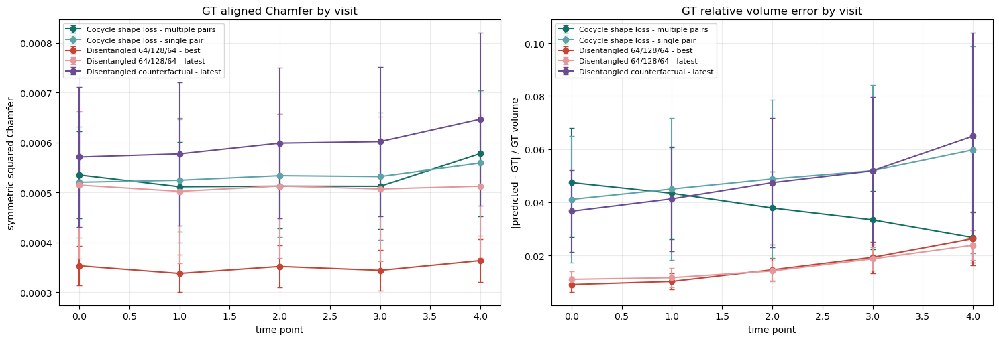

model,sid,diagnosis,tp,age,Cocycle shape loss - multiple pairs,Cocycle shape loss - single pair,Disentangled 64/128/64 - best,Disentangled 64/128/64 - latest,Disentangled counterfactual - latest
0,4,1,0,78.753929,0.001044,0.001613,0.000180,0.000180,0.000826
1,4,1,1,80.586525,0.000976,0.001707,0.000182,0.000174,0.001000
2,4,1,2,82.017929,0.000994,0.001800,0.000199,0.000201,0.001240
3,4,1,3,82.758339,0.000985,0.001855,0.000206,0.000165,0.001369
4,4,1,4,84.678932,0.001792,0.002083,0.000419,0.000300,0.001985
5,27,0,0,77.962471,0.001316,0.001449,0.000710,0.001030,0.001135
6,27,0,1,78.649971,0.001356,0.001612,0.000714,0.001037,0.001193
7,27,0,2,79.368477,0.001317,0.001471,0.000681,0.001070,0.001094
8,27,0,3,81.046677,0.001368,0.001514,0.000724,0.001060,0.001136
9,27,0,4,81.998978,0.001511,0.001696,0.000865,0.001126,0.001306


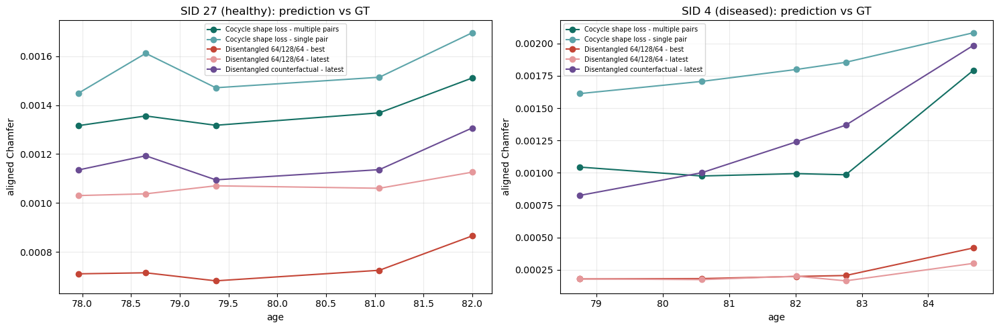

In [29]:
model_colors = {
    "multiple_pairs": "#136F63",
    "single_pair": "#5CA4A9",
    "subset64_best": "#C44536",
    "subset64_latest": "#E5989B",
    "counterfactual_disentangled_latest": "#6A4C93",
}

direct_df = GT_FORECAST_DF[GT_FORECAST_DF["rollout"] == "direct"].copy()

fig, axes = plt.subplots(1, 2, figsize=(15, 5.2))
for model_key, model in GT_MODELS.items():
    subset = direct_df[direct_df["model_key"] == model_key]
    curve = (
        subset.groupby("tp")
        .agg(
            mean_chamfer=("aligned_chamfer", "mean"),
            sem_chamfer=("aligned_chamfer", "sem"),
            mean_volume_error=("relative_volume_error", "mean"),
            sem_volume_error=("relative_volume_error", "sem"),
        )
        .reset_index()
    )
    color = model_colors[model_key]
    axes[0].errorbar(
        curve["tp"],
        curve["mean_chamfer"],
        yerr=curve["sem_chamfer"],
        marker="o",
        capsize=3,
        color=color,
        label=model["label"],
    )
    axes[1].errorbar(
        curve["tp"],
        curve["mean_volume_error"],
        yerr=curve["sem_volume_error"],
        marker="o",
        capsize=3,
        color=color,
        label=model["label"],
    )

axes[0].set_title("GT aligned Chamfer by visit")
axes[0].set_xlabel("time point")
axes[0].set_ylabel("symmetric squared Chamfer")
axes[0].grid(alpha=0.25)
axes[0].legend(fontsize=8)
axes[1].set_title("GT relative volume error by visit")
axes[1].set_xlabel("time point")
axes[1].set_ylabel("|predicted - GT| / GT volume")
axes[1].grid(alpha=0.25)
axes[1].legend(fontsize=8)
plt.tight_layout()
plt.show()


def selected_subject_gt_table(sids=(HEALTHY_SID, DISEASED_SID), rollout="direct"):
    return (
        GT_FORECAST_DF[
            GT_FORECAST_DF["sid"].isin(sids)
            & (GT_FORECAST_DF["rollout"] == rollout)
        ]
        .pivot_table(
            index=["sid", "diagnosis", "tp", "age"],
            columns="model",
            values="aligned_chamfer",
        )
        .reset_index()
    )


display(selected_subject_gt_table())

fig, axes = plt.subplots(1, 2, figsize=(15, 5), squeeze=False)
for column, sid in enumerate((HEALTHY_SID, DISEASED_SID)):
    ax = axes[0, column]
    for model_key, model in GT_MODELS.items():
        subset = direct_df[
            (direct_df["sid"] == sid)
            & (direct_df["model_key"] == model_key)
        ].sort_values("age")
        ax.plot(
            subset["age"],
            subset["aligned_chamfer"],
            marker="o",
            color=model_colors[model_key],
            label=model["label"],
        )
    status = "healthy" if RECORDS[sid][0]["diagnosis"] == 0 else "diseased"
    ax.set_title(f"SID {sid} ({status}): prediction vs GT")
    ax.set_xlabel("age")
    ax.set_ylabel("aligned Chamfer")
    ax.grid(alpha=0.25)
    ax.legend(fontsize=7)
plt.tight_layout()
plt.show()


### Export and interpretation

Use `GT_RANKING` for the all-subject result and `GT_PAIRED_DELTAS` to determine whether
an apparent improvement is consistent across subjects. Do not select a model from SID 27
and SID 4 alone.

Interpretation rules:

- Lower future Chamfer is better.
- Baseline reconstruction should be inspected separately; a poor baseline anchor can
  dominate every later forecast.
- If one model improves Chamfer but worsens volume error, inspect the meshes because it may
  match local geometry while missing global thinning.
- The diagnosis contrast in the non-disentangled models remains a conditional total effect.
  GT accuracy does not make that contrast a disentangled disease component.
- Historical epoch-800/1000 notebook results are context only because both checkpoint and
  Chamfer alignment differ. Current checkpoint rows in `GT_RANKING` are the valid matched
  comparison.


In [30]:
GT_OUTPUT_DIR = ROOT / "analysis_torus_cocycle_ground_truth_comparison"
GT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

GT_FORECAST_DF.to_csv(GT_OUTPUT_DIR / "gt_forecast_metrics.csv", index=False)
subject_summary.to_csv(GT_OUTPUT_DIR / "gt_subject_summary.csv", index=False)
GT_RANKING.to_csv(GT_OUTPUT_DIR / "gt_model_ranking.csv", index=False)
GT_PAIRED_DELTAS.to_csv(GT_OUTPUT_DIR / "gt_paired_deltas.csv", index=False)

gt_summary = {
    "models": GT_MODEL_TABLE.to_dict("records"),
    "subjects": int(GT_FORECAST_DF["sid"].nunique()),
    "visits": int(GT_FORECAST_DF["scan_id"].nunique()),
    "grid_resolution": int(GT_EVAL_GRID_RES),
    "chamfer_samples": int(GT_EVAL_CHAMFER_SAMPLES),
    "anchor_steps": int(GT_EVAL_ANCHOR_STEPS),
    "ranking": GT_RANKING.to_dict("records"),
}
(GT_OUTPUT_DIR / "summary.json").write_text(json.dumps(gt_summary, indent=2))

print("Saved GT comparison to:", GT_OUTPUT_DIR)
for path in sorted(GT_OUTPUT_DIR.iterdir()):
    print(" ", path.name)


Saved GT comparison to: /home/jakaria/INR/Deep3DComp/analysis_torus_cocycle_ground_truth_comparison
  gt_forecast_metrics.csv
  gt_model_ranking.csv
  gt_paired_deltas.csv
  gt_subject_summary.csv
  summary.json
